In [1]:
%matplotlib inline

# Display
import matplotlib.pyplot as plt
from PIL import Image

# Torch
import torch
from torch.utils.data import DataLoader
from torch import optim, nn
import torchvision.transforms as transforms

# Custom
import data
import model
import utils

First we load the 2 models trained for our classification purpose and obtain the model weights of the convolution layers

In [2]:
L_RATE = 0.001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
fl_image_path = './saved_models/fl_model.pth'
sl_image_path = './saved_models/sl_model.pth'

fl_model = model.CNN().to(device)
fl_optimizer = optim.Adam(fl_model.parameters(), lr=L_RATE)
fl_model, _ = model.load_model(fl_model, fl_optimizer, fl_image_path, device)

# get all the model children as list
model_children = list(fl_model.children())

In [3]:
model_weights = [] 
conv_layers = [] 

# counter to keep count of the conv layers
counter = 0 

# append all the conv layers and their respective weights to the list
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            if type(model_children[i][j]) == nn.Conv2d:
                counter += 1
                model_weights.append(model_children[i][j].weight)
                conv_layers.append(model_children[i][j])
                    
print(f"Total convolutional layers: {counter}")

Total convolutional layers: 4


Then, we visualize the convolutional layer filters for one of the layers. Our kernel size was 3x3

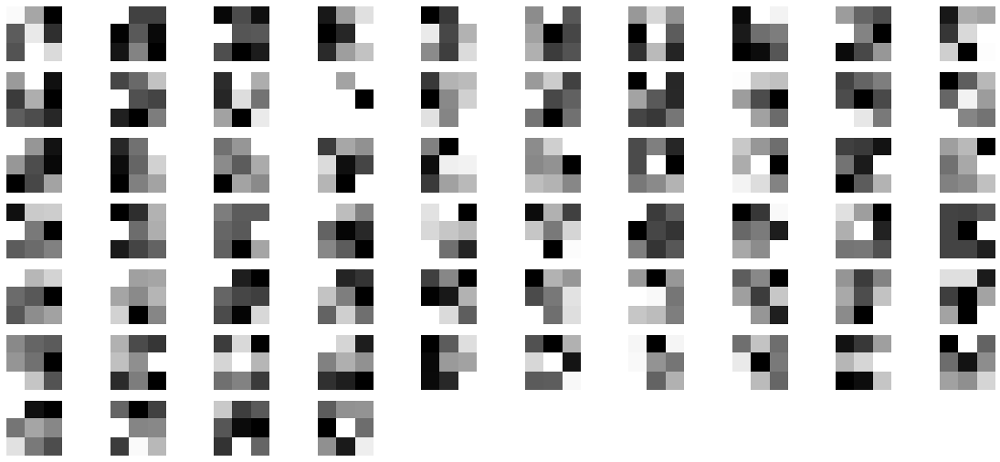

In [4]:
# visualize the first conv layer filters
plt.figure(figsize=(20, 17))
for i, filter in enumerate(model_weights[0]):
    plt.subplot(13, 10, i+1)
    plt.imshow(filter[0, :, :].cpu().detach(), cmap='gray')
    plt.axis('off')
    plt.savefig('./saved_graphs/feature_maps/fl_filter_image.png')
plt.show()

Reading the Image and Defining the transforms

In [23]:
img = data.Lung_Dataset('val', verbose = 0).open_img("normal",0)
img = transforms.ToTensor()(img).unsqueeze(0) # unsqueeze to add artificial first dimension

In [24]:
# pass the image through all the layers
results = [conv_layers[0].cuda()(img.cuda())]
for i in range(1, len(conv_layers)):
    # pass the result from the last layer to the next layer
    results.append(conv_layers[i](results[-1]))
# make a copy of the `results`
outputs = results

Now, we visualize the feature maps

torch.Size([64, 150, 150])
Saving layer 0 feature maps...


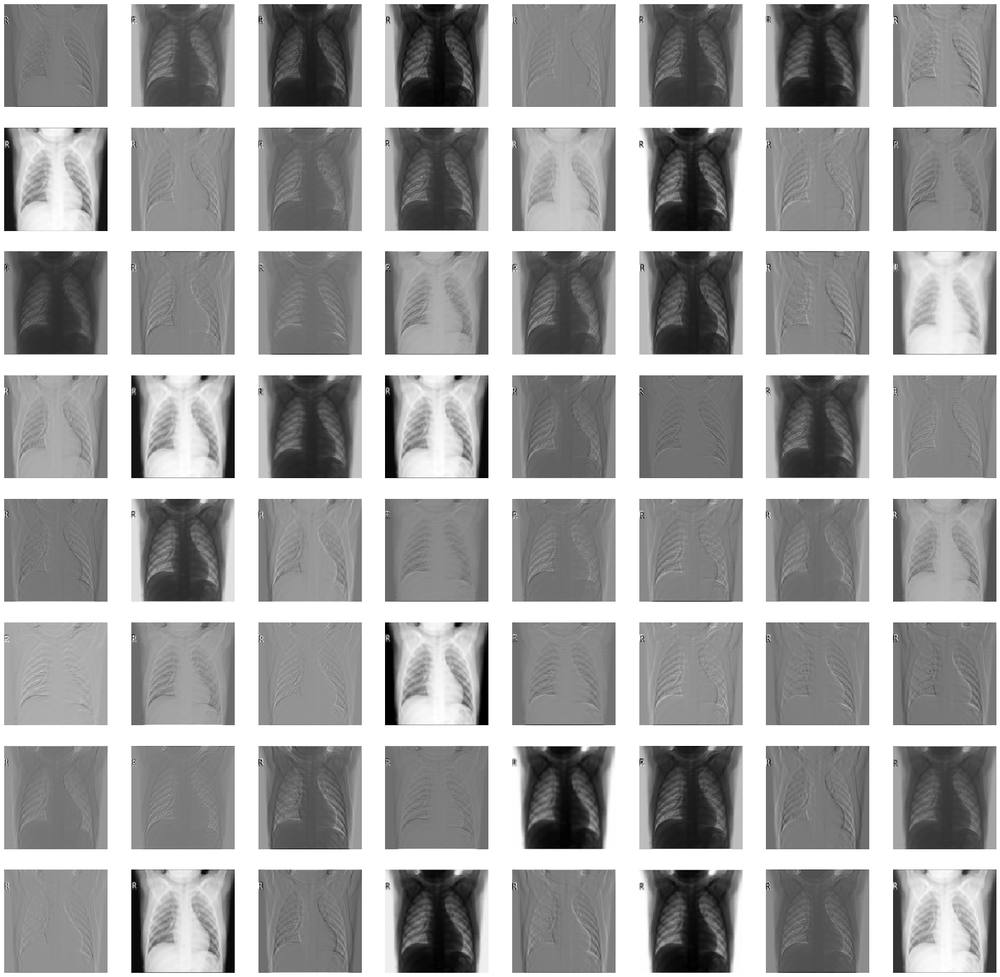

torch.Size([128, 150, 150])
Saving layer 1 feature maps...


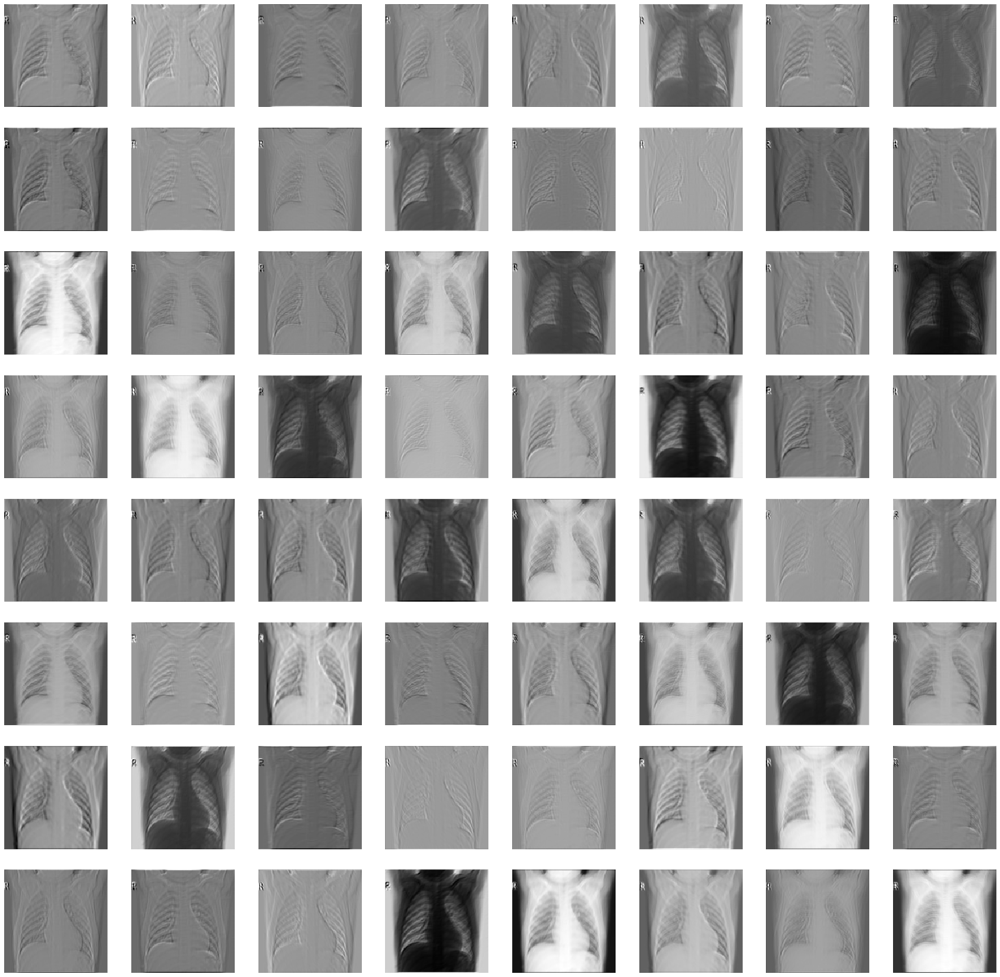

torch.Size([256, 150, 150])
Saving layer 2 feature maps...


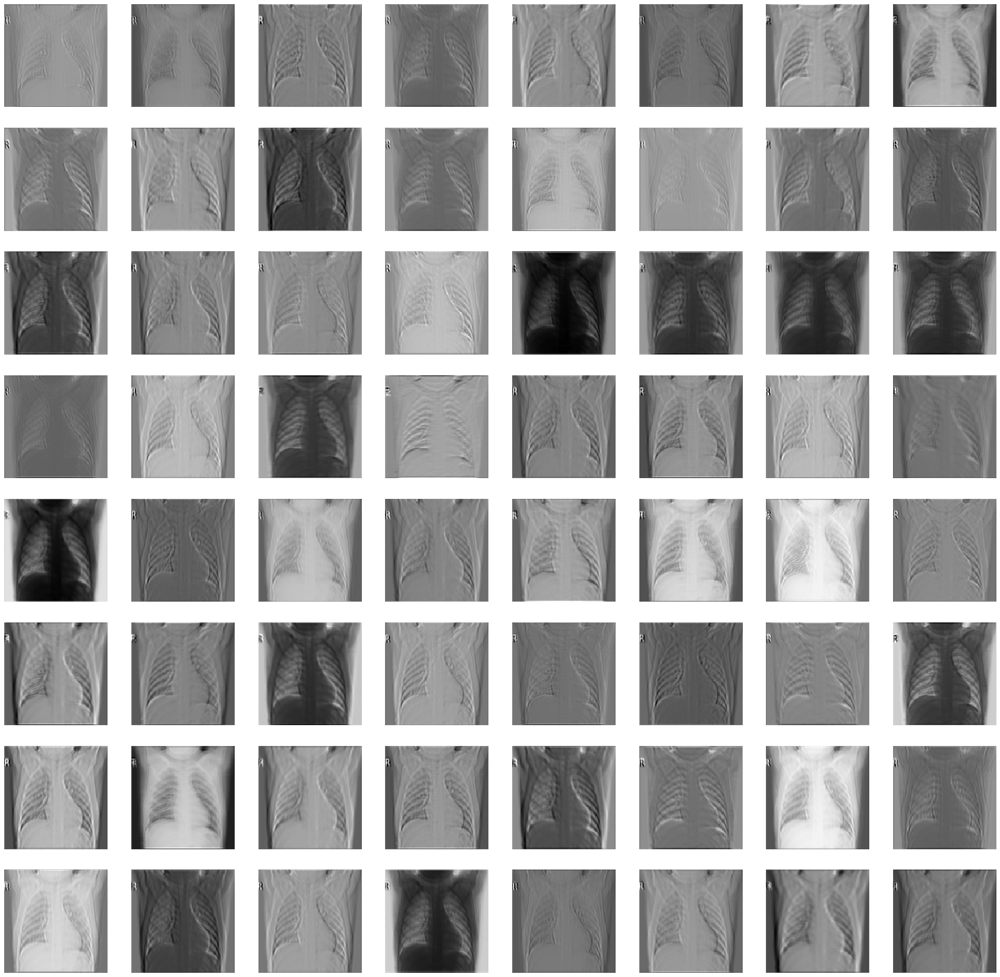

torch.Size([512, 150, 150])
Saving layer 3 feature maps...


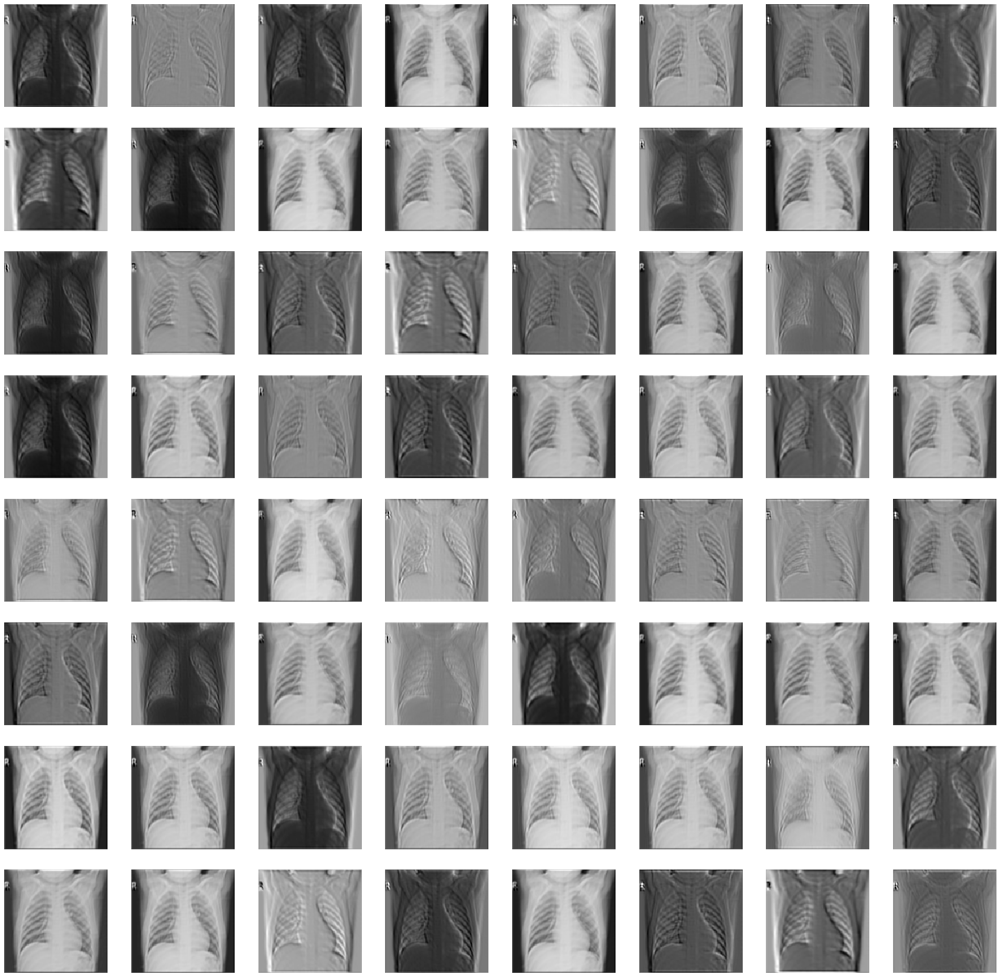

In [25]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(30, 30))
    layer_viz = outputs[num_layer][0, :, :, :].cpu()
    layer_viz = layer_viz.data
    print(layer_viz.size())
    for i, filter in enumerate(layer_viz):
        if i == 64: # we will visualize only 8x8 blocks from each layer
            break
        plt.subplot(8, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
        
    print(f"Saving layer {num_layer} feature maps...")
    plt.savefig(f"./saved_graphs/feature_maps/fl_model/layer_{num_layer}.png")
    plt.show()

Now we repeat this for the second layer model

In [26]:
sl_model = model.CNN().to(device)
sl_optimizer = optim.Adam(sl_model.parameters(), lr=L_RATE)
sl_model, _ = model.load_model(sl_model, sl_optimizer, sl_image_path, device)

# get all the model children as list
sl_model_children = list(sl_model.children())

In [27]:
sl_model_weights = [] 
sl_conv_layers = [] 

# counter to keep count of the conv layers
counter = 0 

# append all the conv layers and their respective weights to the list
for i in range(len(sl_model_children)):
    if type(sl_model_children[i]) == nn.Sequential:
        for j in range(len(sl_model_children[i])):
            if type(sl_model_children[i][j]) == nn.Conv2d:
                counter += 1
                sl_model_weights.append(sl_model_children[i][j].weight)
                sl_conv_layers.append(sl_model_children[i][j])
                    
print(f"Total convolutional layers: {counter}")

Total convolutional layers: 4


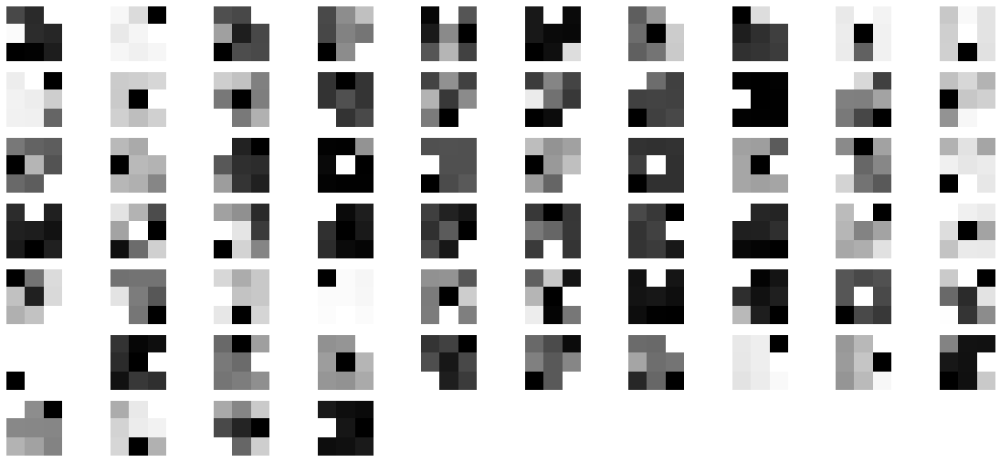

In [28]:
# visualize the first conv layer filters
plt.figure(figsize=(20, 17))
for i, filter in enumerate(sl_model_weights[0]):
    plt.subplot(13, 10, i+1)
    plt.imshow(filter[0, :, :].cpu().detach(), cmap='gray')
    plt.axis('off')
    plt.savefig('./saved_graphs/feature_maps/sl_filter_image.png')
plt.show()

In [29]:
img = data.Lung_Dataset('val', verbose = 2).open_img("covid",0)
img = transforms.ToTensor()(img).unsqueeze(0) # unsqueeze to add artificial first dimension

In [31]:
# pass the image through all the layers
sl_results = [sl_conv_layers[0].cuda()(img.cuda())]
for i in range(1, len(sl_conv_layers)):
    # pass the result from the last layer to the next layer
    sl_results.append(sl_conv_layers[i](sl_results[-1]))
# make a copy of the `results`
sl_outputs = sl_results

torch.Size([64, 150, 150])
Saving layer 0 feature maps...


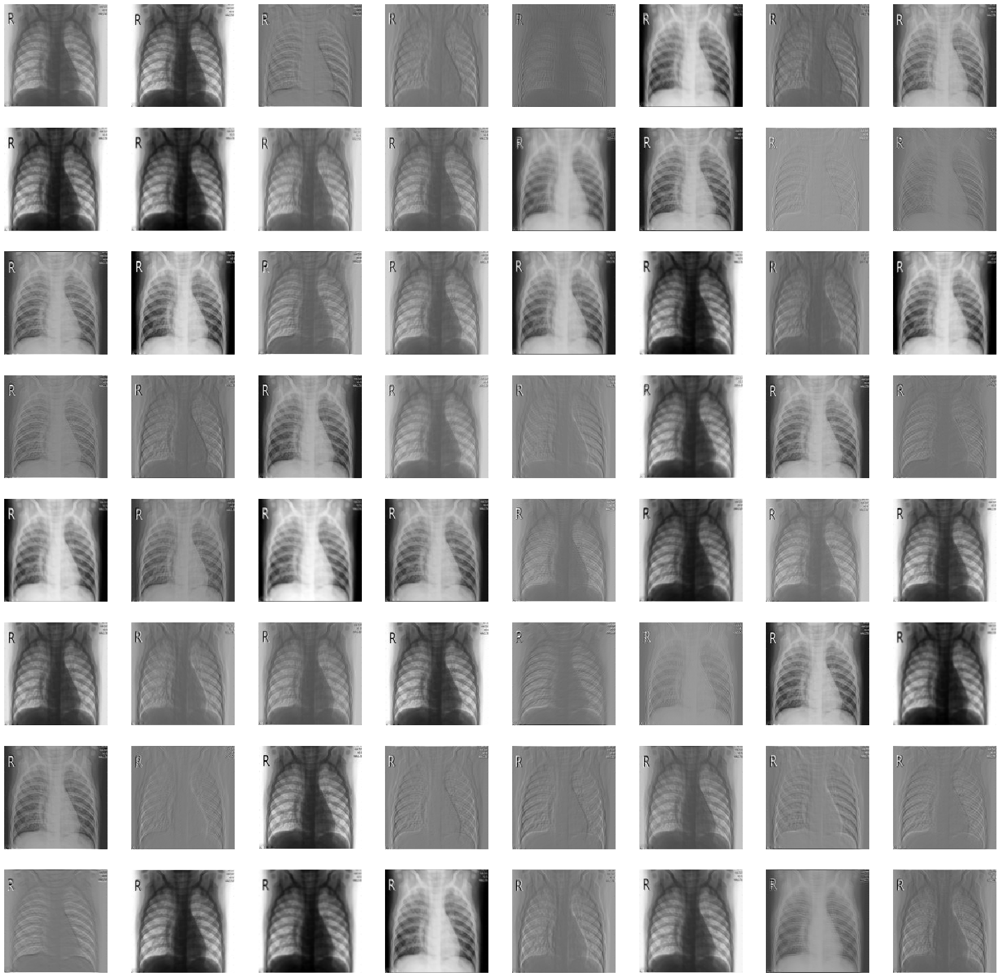

torch.Size([128, 150, 150])
Saving layer 1 feature maps...


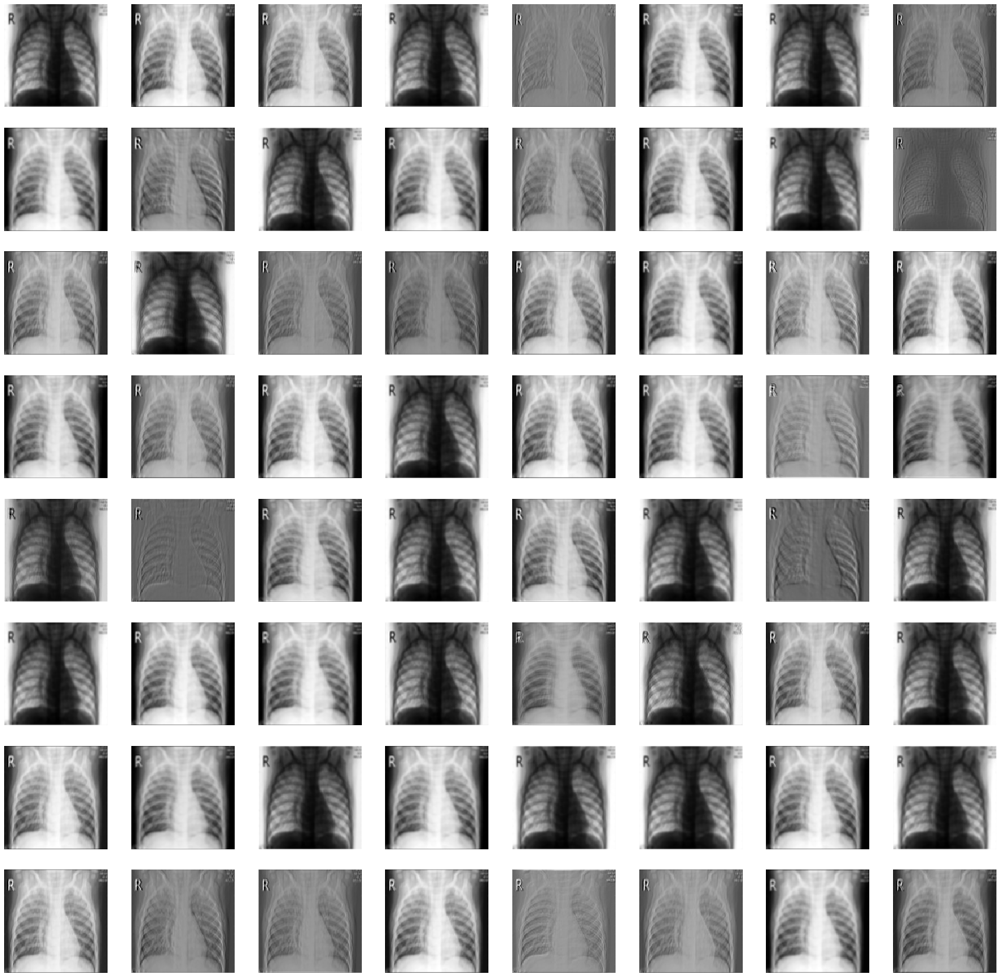

torch.Size([256, 150, 150])
Saving layer 2 feature maps...


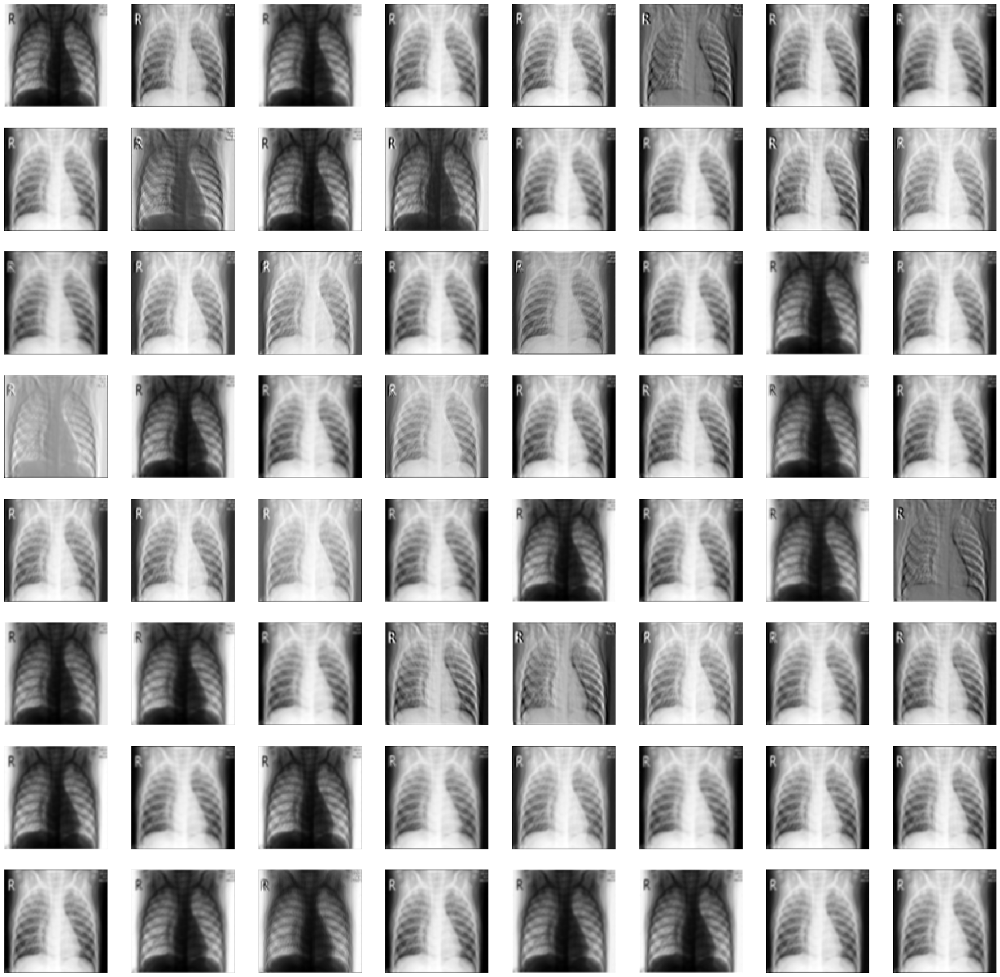

torch.Size([512, 150, 150])
Saving layer 3 feature maps...


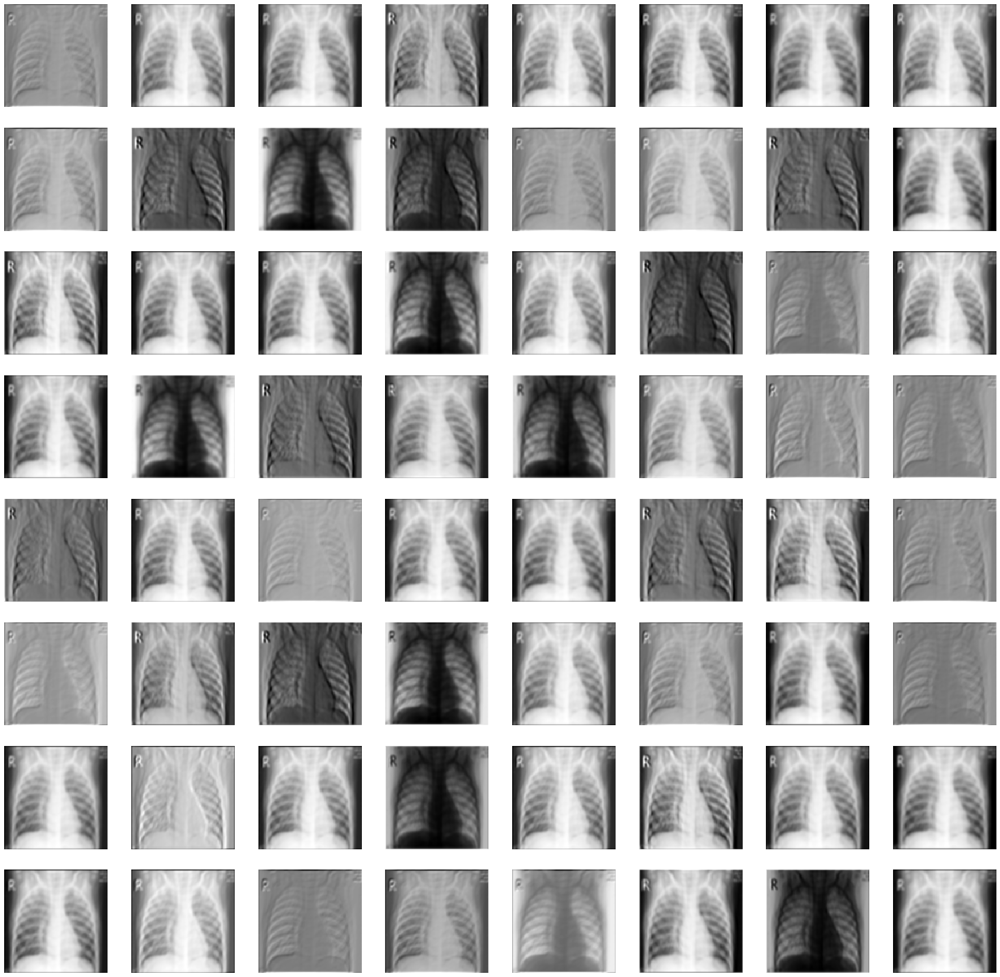

In [32]:
for num_layer in range(len(sl_outputs)):
    plt.figure(figsize=(30, 30))
    layer_viz = sl_outputs[num_layer][0, :, :, :].cpu()
    layer_viz = layer_viz.data
    print(layer_viz.size())
    for i, filter in enumerate(layer_viz):
        if i == 64: # we will visualize only 8x8 blocks from each layer
            break
        plt.subplot(8, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
        
    print(f"Saving layer {num_layer} feature maps...")
    plt.savefig(f"./saved_graphs/feature_maps/sl_model/layer_{num_layer}.png")
    plt.show()